# Introduction

In the dissertation by Danish A. Alvi, 'Application of Probabilistic Graphical Models in Forecasting Crude Oil Price', he aims to solve three problems.

1. Since the existing model such as GARCH model, that assume ARMA process do not incorporate the macro-economic, micro-economic and geopolitical events, the dissertation aims to include these important factors in the model.

2. With the vast amount of datasets available, it is hard to causally relate the data using expert knowledge and is also an error-prone task. The dissertation aims to model a system that learns the causal relationship between the datasets without expert.

3. The futures price of crude oil, being an indicator of the sentiment of the buyers, the dissertation aims to incorporate it in the model.

The Bayesian network is a probabilistic graphical model is a directed acyclic graph, which represents a set of variables as the nodes and their conditional dependencies as the edges. It is a powerful framework that can incorporate data of diverse types and learn the causal ralationships between the features.

The Bayesian network is advantageous in solving the problems, as they can incorporate the macro-economic, micro-economic and financial data into the model. Also, they can model the conditional relationship without the presense of expert. Bayesian network can also be used to incorporate the futures pric of oil as an indicator of buyer sentiments.

# Data Collection and Structuring
Data collection is done from two sources, EIA (Energy Information Administration) and AlphaVantage through API calls. AlphaVantage fetches the commodities (WTI and Brent) and economic indicators (GDP, treasury yield, FED rate, unemployement rate) from FRED. The data is collected in monthly frequency in the time period between 2002 and 2024.

Data is classified as two types during collection:

1. Macroeconomic data, which focuses on data of countries and governments. They also include data related to global demand, supply and inventory of crude oil. More detailed description on the data is provided in the 'Data Dictionary' section.

2. Financial data, which focuses on securities and markets. Here, the monthly closing prices of five energy companies are used.

3. Microeconmic data, which focuses on CPI and energy utilization.

## Macroeconomic data

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import requests
import os
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.stattools import jarque_bera
from fredapi import Fred
from myeia.api import API
from dotenv import load_dotenv
load_dotenv()
sns.set(style="whitegrid")
params = {
    'figure.titlesize': 'x-large',
    'legend.fontsize': 'medium',
    'axes.labelsize': 'medium',
    'xtick.labelsize':'medium',
    'ytick.labelsize':'medium',
    'axes.titlesize': 'medium',
    'font.family': 'serif'
}
plt.rcParams.update(params)

In [2]:
eia_key = os.getenv('eia_key')
av_key = os.getenv('av_key')
fred_key = os.getenv('fred_key')

In [3]:
eia_series = [
    'STEO.PAPR_NONOPEC.M',
    'STEO.PAPR_OPEC.M',
    'STEO.PATC_OECD.M',
    'STEO.PATC_NON_OECD.M',
    'STEO.COPRPUS.M',
    'STEO.CORIPUS.M',
    'STEO.PASC_OECD_T3.M',
    'STEO.COPS_OPEC.M',
    'STEO.COPC_OPEC.M',
    'STEO.T3_STCHANGE_OOECD.M',
    'STEO.T3_STCHANGE_NOECD.M'
]

eia_units = [
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day',
    'Thousand barrels per day'
]

In [4]:
eia_datasets = []
eia = API(token=eia_key)

def fetch_eia_data(series):
    data = eia.get_series(series)
    return data

for series in eia_series:
    eia_datasets.append(fetch_eia_data(series))

In [5]:
def fetch_data_av(function, interval, key):
    base_url = 'https://learn-api.wqu.edu/1/data-services/alpha-vantage/query?'
    sub_url = f'function={function}&interval={interval}&apikey={key}'
    response = requests.get(base_url + sub_url)
    units = response.json()['unit']
    df = pd.DataFrame(response.json()['data'])
    df.index = pd.to_datetime(df.iloc[:, 0])
    df.drop(columns='date', inplace=True)
    df.columns = [function]
    df[function] = pd.to_numeric(df[function], errors='coerce')
    return df, units

In [6]:
commodities = ['WTI', 'BRENT']
commodities_datasets = []
commodities_units = []

for comm in commodities:
    commodities_datasets.append(fetch_data_av(comm, 'monthly', av_key)[0])
    commodities_units.append(fetch_data_av(comm, 'monthly', av_key)[1])

In [7]:
economic_indicators = ['REAL_GDP', 'TREASURY_YIELD', 'FEDERAL_FUNDS_RATE', 'UNEMPLOYMENT']
economic_datasets = []
economic_units = []

for eco in economic_indicators:
    economic_datasets.append(fetch_data_av(eco, 'quarterly', av_key)[0])
    economic_units.append(fetch_data_av(eco, 'quarterly', av_key)[1])

In [8]:
macro_economic_datasets = eia_datasets + commodities_datasets + economic_datasets

In [9]:
macro_economic_df = pd.concat(macro_economic_datasets, axis=1)
macro_economic_df.columns = eia_series + commodities + economic_indicators

macro_economic_df = macro_economic_df.loc['2002-01-01':'2024-01-01']

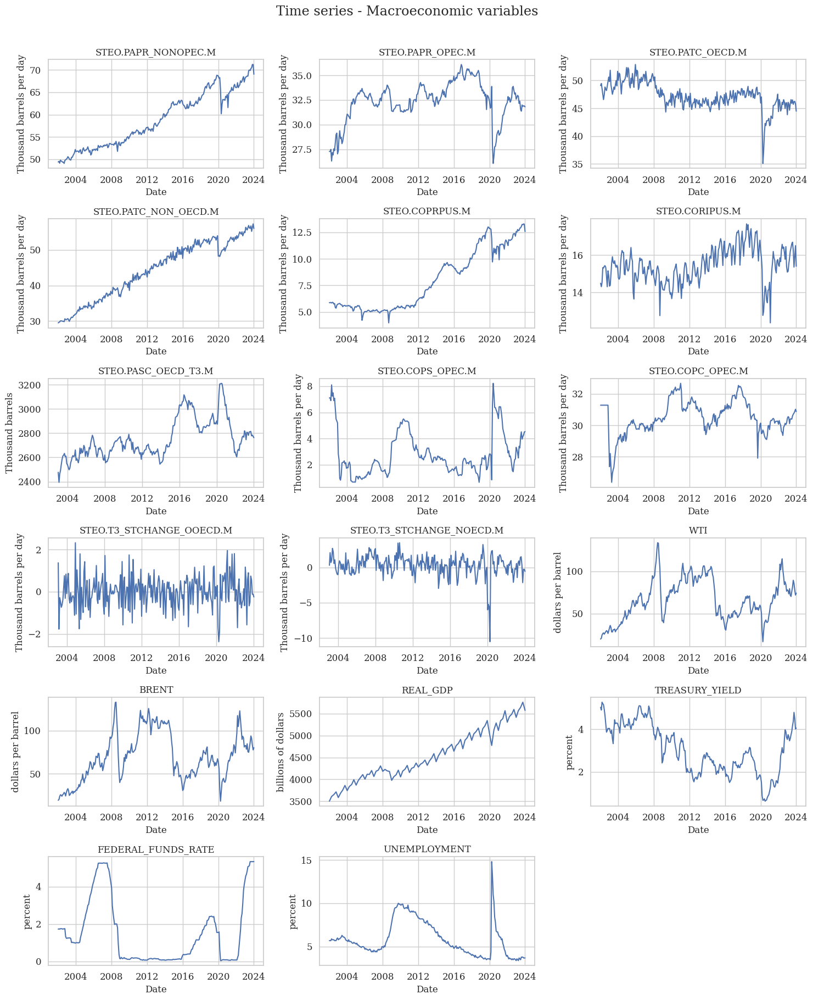

In [10]:
nrows = len(macro_economic_df.columns) // 3 + (len(macro_economic_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(macro_economic_df.columns):
    sns.lineplot(data=macro_economic_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])

for i in range(len(macro_economic_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Macroeconomic variables', y=1.01)

plt.tight_layout()
plt.show()

## Financial data

In [11]:
def fetch_fin_ts(function, ticker, key):
    base_url = 'https://learn-api.wqu.edu/1/data-services/alpha-vantage/query?'
    sub_url = f'function={function}&symbol={ticker}&apikey={key}'
    response = requests.get(base_url + sub_url)
    df = pd.DataFrame(response.json()['Monthly Time Series']).T[['4. close']]
    df.index = pd.to_datetime(df.index)
    df.columns = [ticker]
    df[ticker] = pd.to_numeric(df[ticker], errors='coerce')
    return df

In [12]:
tickers = ['XOM', 'CVX', 'BP', 'CNQ', 'COP']

financial_datasets = []

for ticker in tickers:
    data = fetch_fin_ts('time_series_monthly', ticker, av_key)
    financial_datasets.append(data)

In [13]:
financial_df = pd.concat(financial_datasets, axis=1)

financial_df = financial_df.loc['2001-12-01':'2024-01-01']

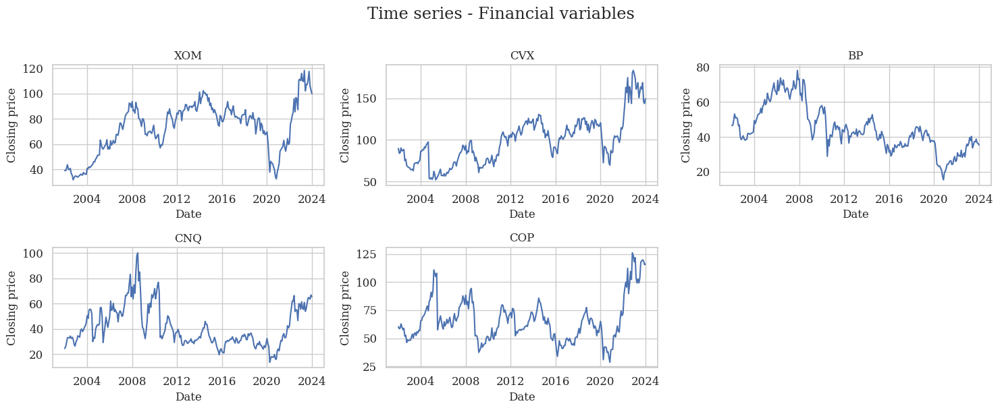

In [14]:
nrows = len(financial_df.columns) // 3 + (len(financial_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(financial_df.columns):
    sns.lineplot(data=financial_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel('Closing price')

for i in range(len(financial_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Financial variables', y=1.01)
plt.tight_layout()


plt.show()

## Microeconomic Data

In [15]:
fred = Fred(api_key=fred_key)
fred_series = [
    'CPIENGSL',
    'CAPG211S',
    'CAPUTLG211S',
    'IPG211111CN',
    'INDPRO',
    'IPN213111N',
    'PCU211211'
]

In [16]:
# Define the time range
start_date = '2001-12-01'
end_date = '2024-01-01'

# Retrieve and concatenate data for each series within the specified time range
data_frames = []
for series_name in fred_series:
    data = fred.get_series(series_name, observation_start=start_date, observation_end=end_date)
    data_frames.append(pd.DataFrame(data, columns=[series_name]))

# Concatenate the data frames into a single DataFrame
fred_data_concatenated = pd.concat(data_frames, axis=1)

# Display the concatenated DataFrame
fred_data_concatenated.head()

,CPIENGSL,CAPG211S,CAPUTLG211S,IPG211111CN,INDPRO,IPN213111N,PCU211211
2001-12-01,113.9,65.1791,94.2895,90.4819,87.8344,93.6327,78.3
2002-01-01,114.2,65.1150,93.4385,90.2664,88.4665,91.3756,84.0
2002-02-01,113.5,65.0321,93.3120,90.3818,88.4661,85.8960,77.9
2002-03-01,117.6,64.9357,92.6243,90.4566,89.1228,81.3015,92.7
2002-04-01,121.5,64.8313,93.2780,89.8210,89.5532,78.7594,111.9


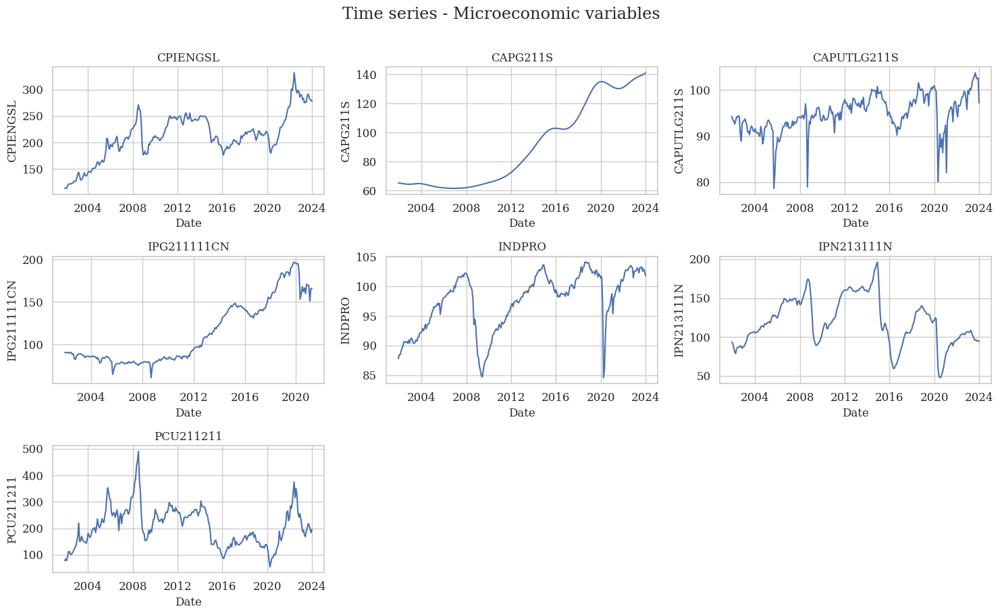

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
nrows = len(fred_data_concatenated.columns) // 3 + (len(fred_data_concatenated.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))
axes = axes.flatten()

for idx, column in enumerate(fred_data_concatenated.columns):
    sns.lineplot(data=fred_data_concatenated[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel(column)

for i in range(len(fred_data_concatenated.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Microeconomic variables', y=1.01)

plt.tight_layout()
plt.show()

# Data Dictionary and Overview

The following tables maps the variable names with their description and frequencies for the macro-economic and financial datasets.

## Macroeconomic data


| Column Name                    |  Description|  Frequency |
|:----------------------------:   |:-------------------------:| :-----------------: |
| STEO.PAPR_NONOPEC.M            |  Non-OPEC production &nbsp; (Thousand barrels per day) |  Monthly |
| STEO.PAPR_OPEC.M               |  OPEC production &nbsp; (Thousand barrels per day)|  Monthly |
| STEO.PATC_OECD.M               |  OECD consumption &nbsp; (Thousand barrels per day)|  Monthly |
| STEO.PATC_NON_OECD.M           |  Non-OECD consumption &nbsp; (Thousand barrels per day)|  Monthly |
| STEO.COPRPUS.M                 |  Domestic production &nbsp; (Thousand barrels per day)|  Monthly |
| STEO.CORIPUS.M                 |  Oil input to refineries &nbsp; (Thousand barrels per day)|  Monthly |
| STEO.PASC_OECD_T3.M            |  OECD commercial inventory &nbsp; (Thousand barrels) |  Monthly |
| STEO.COPS_OPEC.M               |  Surplus capacity &nbsp; (Thousand barrels per day) |  Monthly |
| STEO.COPC_OPEC.M               |  Production capacity &nbsp; (Thousand barrels per day) |  Monthly |
| STEO.T3_STCHANGE_OOECD.M       |  OECD Inventory net withdrawal &nbsp; (Thousand barrels per day) |  Monthly |
| STEO.T3_STCHANGE_NOECD.M       |  non-OECD Inventory net withdrawal &nbsp; (Thousand barrels per day) |  Monthly |
| WTI                            |  WTI crude oil price &nbsp; (Dollars per barrel) |  Monthly |
| BRENT                          |  Brent crude oil price &nbsp; (Dollars per barrel) |  Monthly |
| REAL_GDP                       |  Real GDP &nbsp; (billions of dollars) |  Quarterly |
| TREASURY_YIELD                 |  10-year Treasury yield &nbsp; (percentage) |  Monthly |
| FEDERAL_FUNDS_RATE             |  Federal funds rate &nbsp; (percentage) |  Monthly |
| UNEMPLOYMENT                   |  Unemployment rate &nbsp; (percentage) |  Monthly |



## Financial data

| Column Name         | Description    |  Frequency |
|:---------------------:|:----------------:|:----------------:|
| XOM | Exxon Mobil Corp &nbsp; (Dollars per share) |  Monthly |
| CVX | Chevron Corp &nbsp; (Dollars per share) |  Monthly |
| BP | The British Petroleum Company &nbsp; (Dollars per share) |  Monthly |
| CNQ | Canadian Natural Resources Ltd &nbsp; (Dollars per share) |  Monthly |
| COP | ConocoPhillips &nbsp; (Dollars per share) |  Monthly |

## Micro-economic data


| Column Name                    |  Description|  Frequency |
|:----------------------------:   |:-------------------------:| :-----------------: |
| CPIENGSL            |  Consumer Price Index for All Urban Consumers: Energy in U.S. City Average |  Monthly |
| CAPG211S               |  Industrial Capacity: Mining, Quarrying, and Oil and Gas Extraction: Oil and Gas Extraction (NAICS = 211) |  Monthly |
| CAPUTLG211S               |  Capacity Utilization: Mining, Quarrying, and Oil and Gas Extraction: Oil and Gas Extraction (NAICS = 211) |  Monthly |
| INDPRO                 |  Industrial Production: Total Index |  Monthly |
| IPN213111N                 |  Industrial Production: Mining, Quarrying, and Oil and Gas Extraction: Drilling Oil and Gas Wells (NAICS = 213111) |  Monthly |
| PCU211211            |  Producer Price Index by Industry: Oil and Gas Extraction |  Monthly |

## Data description

| Field               | Description                |
|:---------------------:|:----------------------------:|
| Source              | EIA, AlphaVantage          |
| Start Date          | 2002-01-01                 |  
| End Date            | 2024-01-01                 |
| Total Entries       | 265                        |

# Data Preprocessing
## Missing values and data cleaning
### Macro-economic data

* The GDP from the source is of quarterly frequency and so, there are significant amount null values in GDP. To process the GDP variable, the quarterly GDP is divided into three and the value is filled into the three months.
* The features 'OECD Inventory net withdrawal', 'non-OECD Inventory net withdrawal' and 'OECD commercial inventory' has few missing values at the starting dates and so, a backfill is used to fill them with the first occurance.

In [18]:
macro_economic_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 2002-01-01 to 2024-01-01
Freq: MS
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   STEO.PAPR_NONOPEC.M       265 non-null    float64
 1   STEO.PAPR_OPEC.M          265 non-null    float64
 2   STEO.PATC_OECD.M          265 non-null    float64
 3   STEO.PATC_NON_OECD.M      265 non-null    float64
 4   STEO.COPRPUS.M            265 non-null    float64
 5   STEO.CORIPUS.M            265 non-null    float64
 6   STEO.PASC_OECD_T3.M       253 non-null    float64
 7   STEO.COPS_OPEC.M          265 non-null    float64
 8   STEO.COPC_OPEC.M          265 non-null    float64
 9   STEO.T3_STCHANGE_OOECD.M  252 non-null    float64
 10  STEO.T3_STCHANGE_NOECD.M  252 non-null    float64
 11  WTI                       265 non-null    float64
 12  BRENT                     265 non-null    float64
 13  REAL_GDP                  88 non-null

In [19]:
macro_economic_df['REAL_GDP'] = macro_economic_df['REAL_GDP'] / 3
macro_economic_df['REAL_GDP'].ffill(inplace=True)

macro_economic_df = macro_economic_df.apply(lambda x: x.bfill())

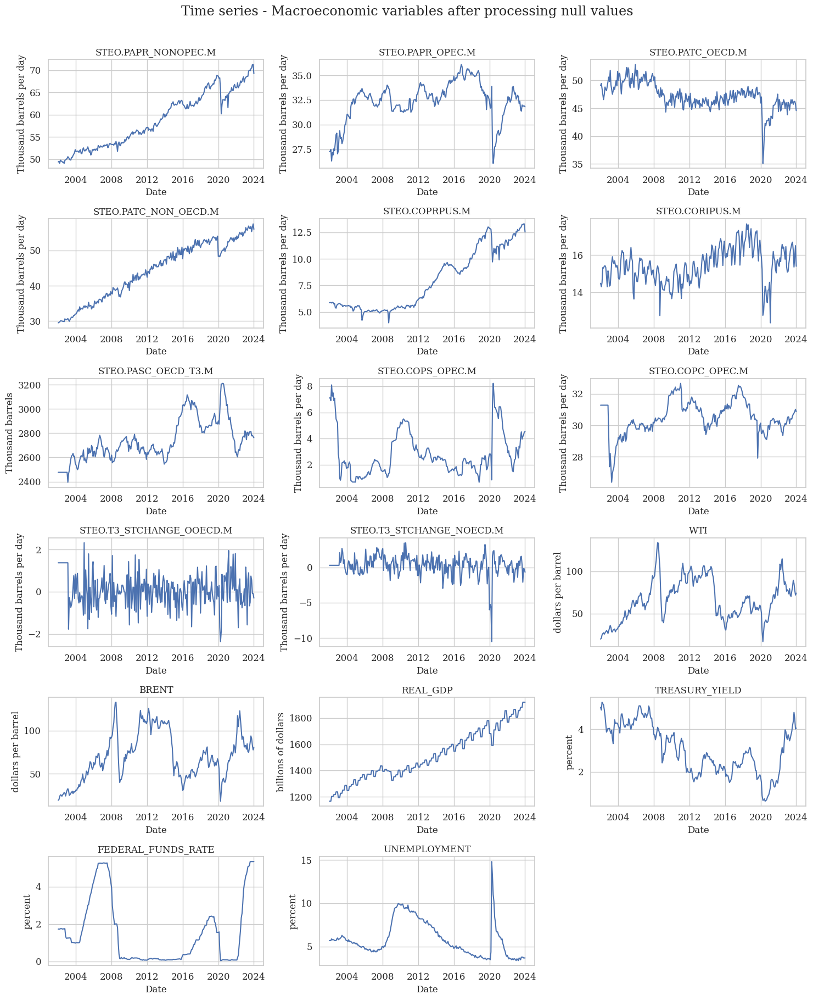

In [20]:
nrows = len(macro_economic_df.columns) // 3 + (len(macro_economic_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(macro_economic_df.columns):
    sns.lineplot(data=macro_economic_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])

for i in range(len(macro_economic_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Macroeconomic variables after processing null values', y=1.01)
plt.tight_layout()

plt.show()

### Financial data

In terms of financial data, the date-time index contradicts with the macro-economic data. The financial data has the index as the end of month, while the macro-economic data has their index as the beginning of the month. So, the financial data's index is shifted by 1 day, i.e., the beginning of the next month.

In [21]:
financial_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 2001-12-31 to 2023-12-29
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   XOM     265 non-null    float64
 1   CVX     265 non-null    float64
 2   BP      265 non-null    float64
 3   CNQ     265 non-null    float64
 4   COP     265 non-null    float64
dtypes: float64(5)
memory usage: 12.4 KB


In [22]:
financial_df.index = financial_df.index + pd.offsets.MonthBegin(1)

In [23]:
financial_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 2002-01-01 to 2024-01-01
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   XOM     265 non-null    float64
 1   CVX     265 non-null    float64
 2   BP      265 non-null    float64
 3   CNQ     265 non-null    float64
 4   COP     265 non-null    float64
dtypes: float64(5)
memory usage: 12.4 KB


### Microeconomic data

In [24]:
fred_data_concatenated.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 266 entries, 2001-12-01 to 2024-01-01
Freq: MS
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CPIENGSL     266 non-null    float64
 1   CAPG211S     266 non-null    float64
 2   CAPUTLG211S  266 non-null    float64
 3   IPG211111CN  233 non-null    float64
 4   INDPRO       266 non-null    float64
 5   IPN213111N   266 non-null    float64
 6   PCU211211    266 non-null    float64
dtypes: float64(7)
memory usage: 16.6 KB


In [25]:
fred_data_concatenated['IPG211111CN'] = fred_data_concatenated['IPG211111CN'] / 3
fred_data_concatenated['IPG211111CN'].ffill(inplace=True)

fred_data_concatenated = fred_data_concatenated.apply(lambda x: x.bfill())

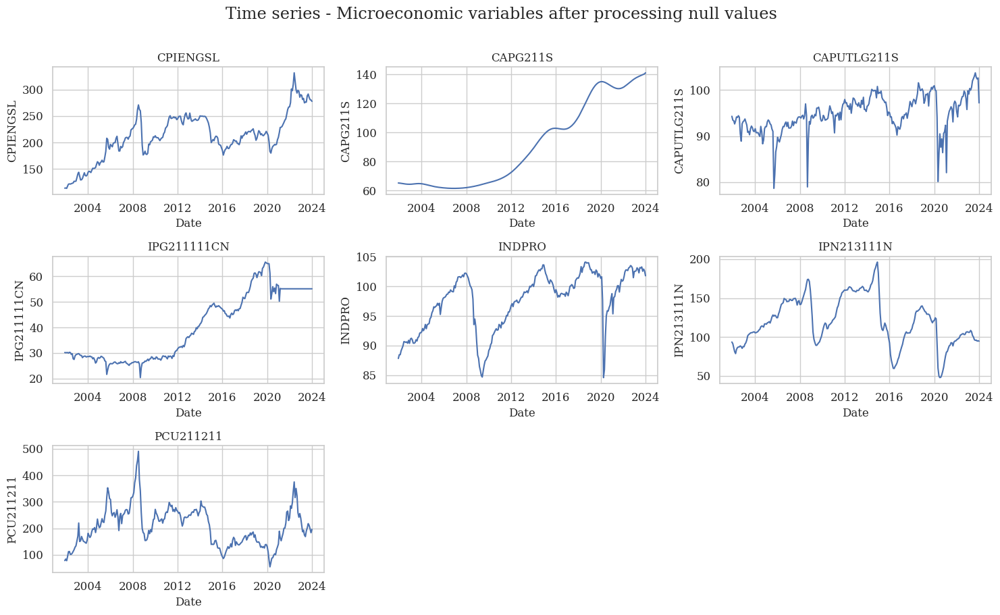

In [26]:
# Plotting
nrows = len(fred_data_concatenated.columns) // 3 + (len(fred_data_concatenated.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))
axes = axes.flatten()

for idx, column in enumerate(fred_data_concatenated.columns):
    sns.lineplot(data=fred_data_concatenated[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel(column)

for i in range(len(fred_data_concatenated.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Microeconomic variables after processing null values', y=1.01)

plt.tight_layout()
plt.show()

## Handling outliers

In this study, the datapoints where the absolute value of the z_score is greater than 3 are considered as outliers. The outliers are detected using the `detect_outliers` function, which returns a dictionary of timestamps where the outliers are present as the key and a list of features where the outliers are detected as the corresponding values. This was performed in both macro-economic and financial data. The outliers are then plotted on the time-series plot. On visual inspection, it was identified that, most of the outliers were present during the Covid-19 crisis period.

The outliers are then handled using the `process_outliers` function by winsorizing the datapoints with negative z-score values to 5th percentile and with positive z-score values to 95th percentile.

### Macro-economic data

In [27]:
def detect_outliers(data):
    z_score = (data - data.mean()) / data.std()
    outliers_mask = z_score.abs() > 3
    outliers_dict = outliers_mask.apply(lambda col: outliers_mask.columns[col].tolist(), axis=1).to_dict()
    outliers_dict = {k: v for k, v in outliers_dict.items() if v}
    return outliers_dict

In [28]:
outliers_macro_dict = detect_outliers(macro_economic_df)
outliers_macro_dict

{Timestamp('2002-04-01 00:00:00'): ['STEO.COPS_OPEC.M'],
 Timestamp('2003-04-01 00:00:00'): ['STEO.COPC_OPEC.M'],
 Timestamp('2003-05-01 00:00:00'): ['STEO.COPC_OPEC.M'],
 Timestamp('2003-06-01 00:00:00'): ['STEO.COPC_OPEC.M'],
 Timestamp('2020-01-01 00:00:00'): ['STEO.T3_STCHANGE_NOECD.M'],
 Timestamp('2020-02-01 00:00:00'): ['STEO.T3_STCHANGE_NOECD.M'],
 Timestamp('2020-03-01 00:00:00'): ['STEO.T3_STCHANGE_NOECD.M'],
 Timestamp('2020-04-01 00:00:00'): ['STEO.PATC_OECD.M',
  'STEO.T3_STCHANGE_OOECD.M',
  'STEO.T3_STCHANGE_NOECD.M',
  'UNEMPLOYMENT'],
 Timestamp('2020-05-01 00:00:00'): ['STEO.PATC_OECD.M', 'UNEMPLOYMENT'],
 Timestamp('2020-06-01 00:00:00'): ['STEO.PAPR_OPEC.M', 'STEO.COPS_OPEC.M'],
 Timestamp('2021-02-01 00:00:00'): ['STEO.CORIPUS.M']}

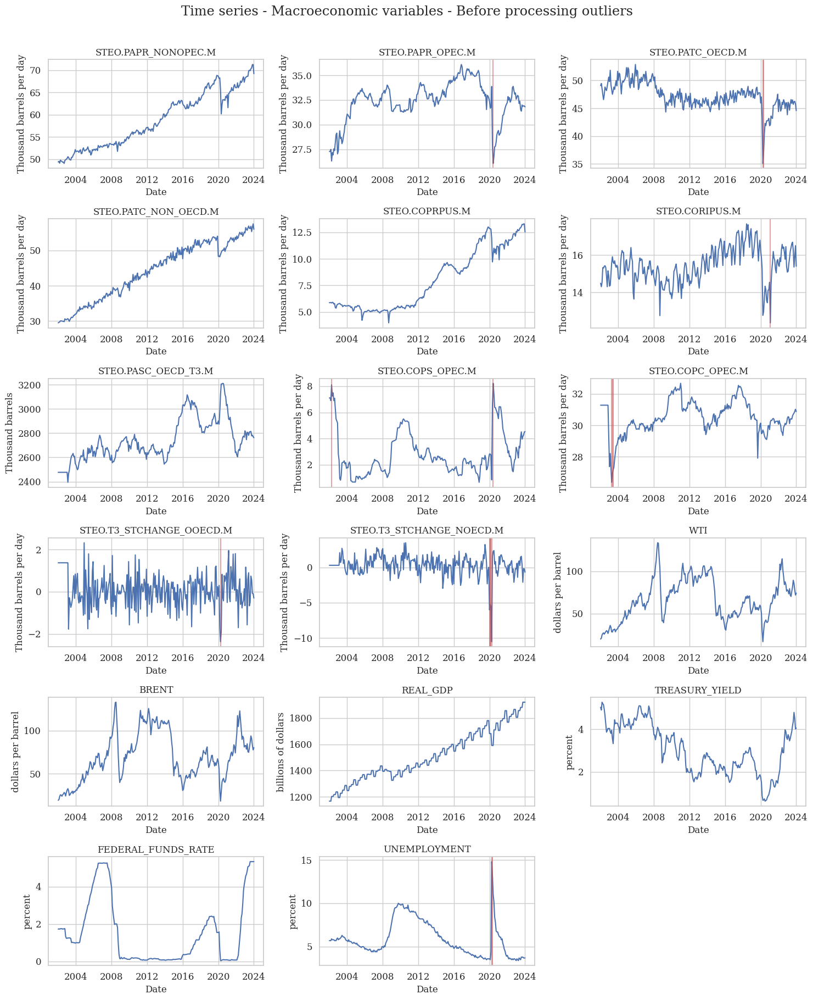

In [29]:
nrows = len(macro_economic_df.columns) // 3 + (len(macro_economic_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(macro_economic_df.columns):
    sns.lineplot(data=macro_economic_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])
    for k, v in outliers_macro_dict.items():
        if column in v:
            axes[idx].axvline(k, color='r', alpha=0.5)

for i in range(len(macro_economic_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Macroeconomic variables - Before processing outliers', y=1.01)
plt.tight_layout()

plt.show()

In [30]:
def process_outliers(series, q):
    series_clean = series.copy()
    lb = series_clean.quantile(q)
    ub = series_clean.quantile(1-q)
    z_score = (series_clean - series_clean.mean()) / series_clean.std()
    outliers = series_clean[z_score.abs() > 3]
    outliers = outliers.apply(lambda x: lb if (ub - x) < (lb - x) else ub)
    series_clean.loc[outliers.index] = outliers
    return series_clean

In [31]:
macro_economic_df_clean = macro_economic_df.apply(process_outliers, args=[0.05])

outliers_macro_clean_dict = detect_outliers(macro_economic_df_clean)

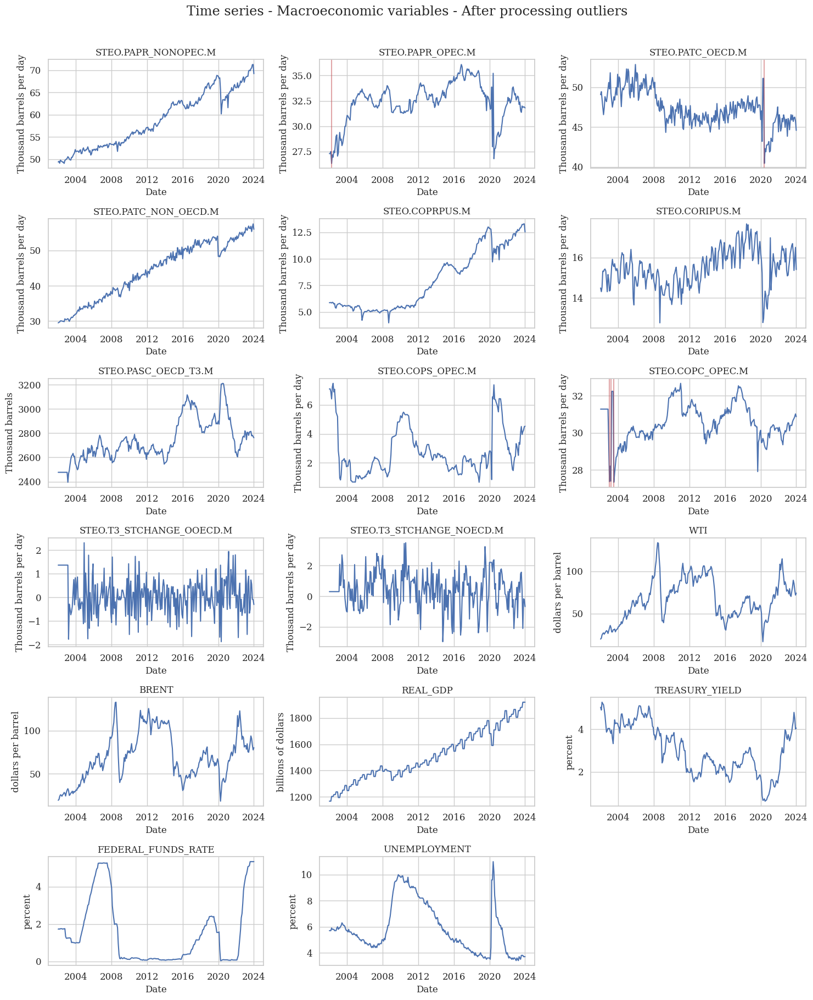

In [32]:
nrows = len(macro_economic_df.columns) // 3 + (len(macro_economic_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(macro_economic_df_clean.columns):
    sns.lineplot(data=macro_economic_df_clean[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])
    for k, v in outliers_macro_clean_dict.items():
        if column in v:
            axes[idx].axvline(k, color='r', alpha=0.5)

for i in range(len(macro_economic_df_clean.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Macroeconomic variables - After processing outliers', y=1.01)
plt.tight_layout()

plt.show()

### Financial data

In [33]:
outliers_financial_dict = detect_outliers(financial_df)

In [34]:
outliers_financial_dict

{Timestamp('2008-06-01 00:00:00'): ['CNQ'],
 Timestamp('2008-07-01 00:00:00'): ['CNQ'],
 Timestamp('2022-11-01 00:00:00'): ['COP'],
 Timestamp('2022-12-01 00:00:00'): ['CVX']}

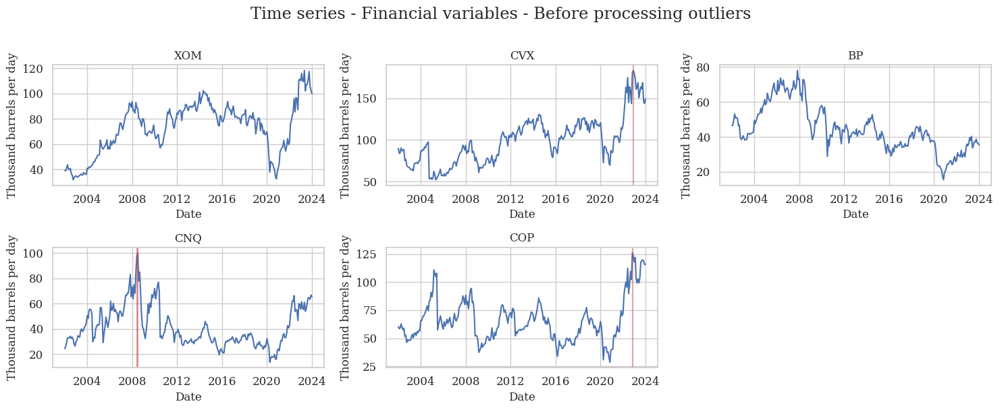

In [35]:
nrows = len(financial_df.columns) // 3 + (len(financial_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(financial_df.columns):
    sns.lineplot(data=financial_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])
    for k, v in outliers_financial_dict.items():
        if column in v:
            axes[idx].axvline(k, color='r', alpha=0.5)

for i in range(len(financial_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Financial variables - Before processing outliers', y=1.01)
plt.tight_layout()

plt.show()

In [36]:
financial_df_clean = financial_df.apply(process_outliers, args=[0.01])

outliers_fin_clean_dict = detect_outliers(financial_df_clean)

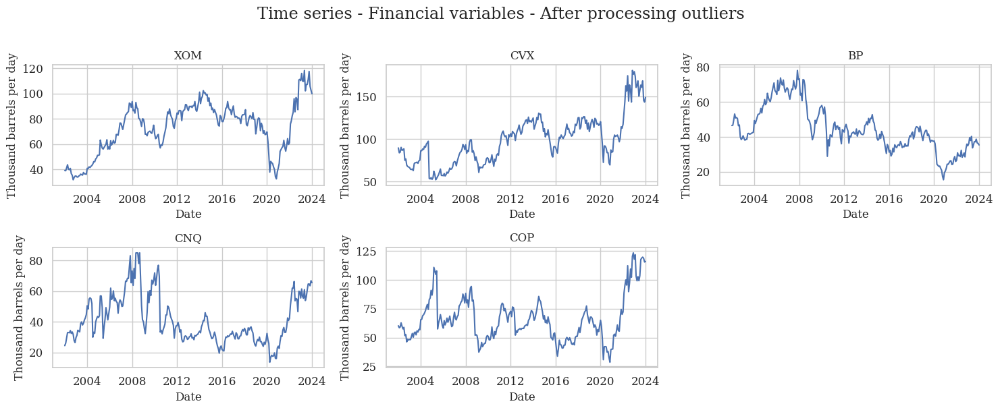

In [37]:
nrows = len(financial_df.columns) // 3 + (len(financial_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(financial_df_clean.columns):
    sns.lineplot(data=financial_df_clean[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel((eia_units + commodities_units + economic_units)[idx])
    for k, v in outliers_fin_clean_dict.items():
        if column in v:
            axes[idx].axvline(k, color='r', alpha=0.5)

for i in range(len(financial_df_clean.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Financial variables - After processing outliers', y=1.01)
plt.tight_layout()

plt.show()

### Microeconomic data

In [38]:
def process_outliers(series, q):
    series_clean = series.copy()
    lb = series_clean.quantile(q)
    ub = series_clean.quantile(1-q)
    z_score = (series_clean - series_clean.mean()) / series_clean.std()
    outliers = series_clean[z_score.abs() > 3]
    outliers = outliers.apply(lambda x: lb if (ub - x) < (lb - x) else ub)
    series_clean.loc[outliers.index] = outliers
    return series_clean

In [39]:
micro_economic_df_clean = fred_data_concatenated.apply(process_outliers, args=[0.05])

outliers_micro_clean_dict = detect_outliers(micro_economic_df_clean)

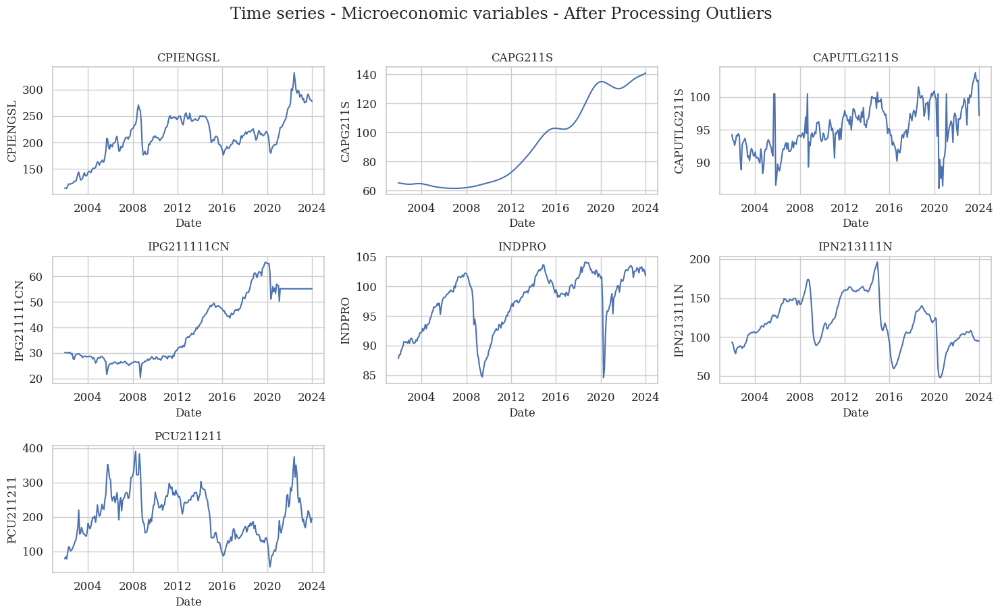

In [40]:
# Plotting
nrows = len(micro_economic_df_clean.columns) // 3 + (len(micro_economic_df_clean.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))
axes = axes.flatten()

for idx, column in enumerate(micro_economic_df_clean.columns):
    sns.lineplot(data=micro_economic_df_clean[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel(column)
    for k, v in outliers_micro_clean_dict.items():
        if column in v:
            axes[idx].axvline(k, color='r', alpha=0.5)
for i in range(len(micro_economic_df_clean.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - Microeconomic variables - After Processing Outliers', y=1.01)

plt.tight_layout()
plt.show()

# Data Integration

In this step, both the macro-economic and financial data are concatenated. Then, the correlation heatmap of the overall dataset was inspected and found that high multi-collinearity exists in the dataset. To process multi-collinearity, the variance inflation factor (VIF) was used. All the features with VIF greater than 50 was removed from the dataset. The parameter 50 was chosen by trial and error, such that the VIF of all the features of the processed dataset are less than 10. It should be noted that the VIF of WTI and BRENT, which are the benchmarks for oil price (target) are very high and will be removed from the sterilized dataset.

In [41]:
concat_df = pd.concat([macro_economic_df_clean, micro_economic_df_clean, financial_df_clean], axis=1)

concat_df.head()

,STEO.PAPR_NONOPEC.M,STEO.PAPR_OPEC.M,STEO.PATC_OECD.M,STEO.PATC_NON_OECD.M,STEO.COPRPUS.M,STEO.CORIPUS.M,STEO.PASC_OECD_T3.M,STEO.COPS_OPEC.M,STEO.COPC_OPEC.M,STEO.T3_STCHANGE_OOECD.M,...,CAPUTLG211S,IPG211111CN,INDPRO,IPN213111N,PCU211211,XOM,CVX,BP,CNQ,COP
2001-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,94.2895,30.160633,87.8344,93.6327,78.3,NaN,NaN,NaN,NaN,NaN
2002-01-01,49.396401,27.282975,49.080039,29.514617,5.873430,14.487,2476.715001,7.104182,31.278895,1.369643,...,93.4385,30.088800,88.4665,91.3756,84.0,39.30,89.61,46.51,24.40,60.26
2002-02-01,49.529021,27.276524,49.459933,29.659886,5.880913,14.306,2476.715001,7.110823,31.278895,1.369643,...,93.3120,30.127267,88.4661,85.8960,77.9,39.05,83.80,46.72,26.04,58.47
2002-03-01,49.112108,27.489427,48.539852,29.768044,5.885822,14.526,2476.715001,6.897197,31.278895,1.369643,...,92.6243,30.152200,89.1228,81.3015,92.7,41.30,84.44,49.55,29.37,59.11
2002-04-01,49.795212,26.312570,47.474659,30.071637,5.844439,15.325,2476.715001,6.416000,31.278895,1.369643,...,93.2780,29.940333,89.5532,78.7594,111.9,43.83,90.27,53.10,32.94,62.80


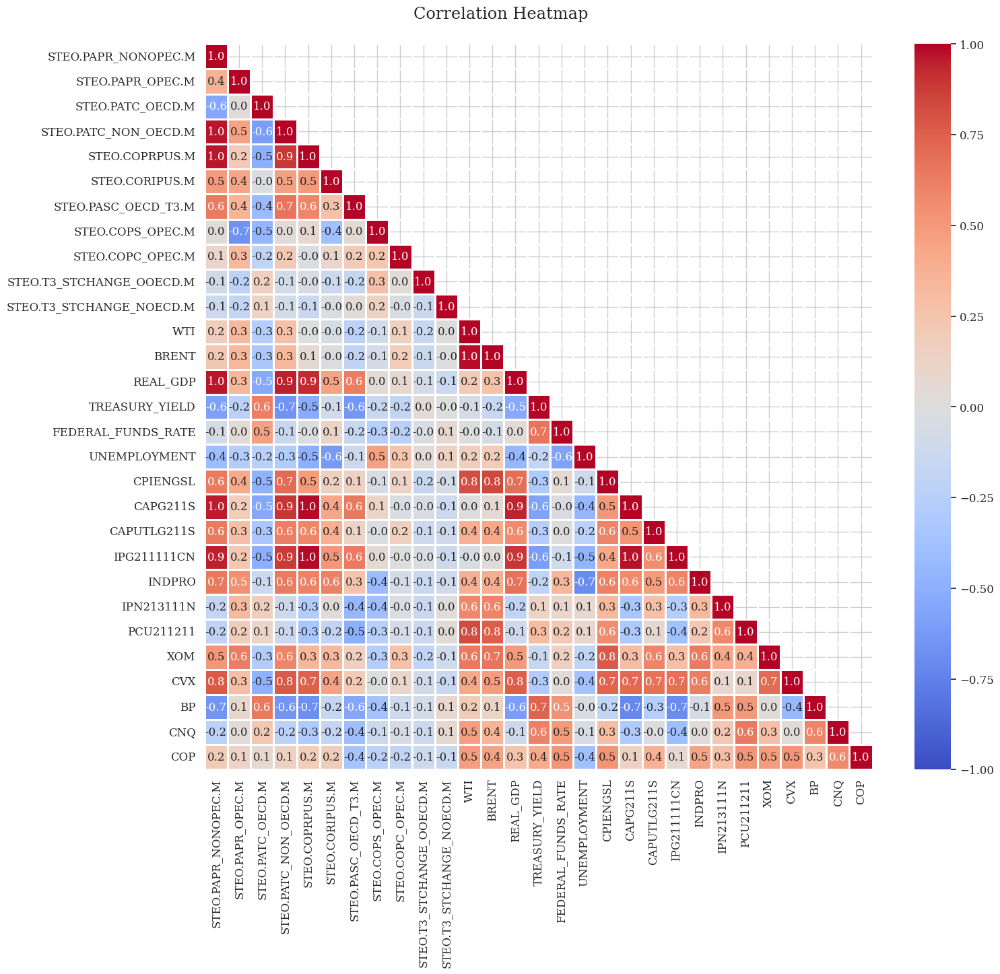

In [42]:
fig, ax = plt.subplots(figsize=(16, 14))
correlation_matrix = concat_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f", linewidths=1, vmin=-1, vmax=1, mask=np.triu(correlation_matrix, k=1), ax=ax)
fig.suptitle('Correlation Heatmap', x=0.4, y=0.92)
plt.show()

In [43]:
def vif(data):
    corr_coef = data.corr()
    vif = np.linalg.inv(corr_coef).diagonal()
    return vif

vif_concat_df = vif(concat_df)

print('VIF of the variables before handling multicollinearity:')
for col, vif_value in zip(concat_df.columns, vif_concat_df):
        print(f"\t{col}: {round(vif_value,3)}")

VIF of the variables before handling multicollinearity:
	STEO.PAPR_NONOPEC.M: 245.446
	STEO.PAPR_OPEC.M: 11.729
	STEO.PATC_OECD.M: 6.018
	STEO.PATC_NON_OECD.M: 446.752
	STEO.COPRPUS.M: 8082.314
	STEO.CORIPUS.M: 4.684
	STEO.PASC_OECD_T3.M: 122.084
	STEO.COPS_OPEC.M: 28.466
	STEO.COPC_OPEC.M: 3.822
	STEO.T3_STCHANGE_OOECD.M: 1.916
	STEO.T3_STCHANGE_NOECD.M: 4.672
	WTI: 151.823
	BRENT: 168.374
	REAL_GDP: 164.087
	TREASURY_YIELD: 51.046
	FEDERAL_FUNDS_RATE: 17.781
	UNEMPLOYMENT: 54.649
	CPIENGSL: 265.0
	CAPG211S: 1657.084
	CAPUTLG211S: 9.795
	IPG211111CN: 2313.782
	INDPRO: 54.876
	IPN213111N: 39.489
	PCU211211: 259.601
	XOM: 31.777
	CVX: 19.881
	BP: 19.85
	CNQ: 8.57
	COP: 7.216


In [44]:
high_vif_cols = concat_df.columns[vif(concat_df) > 50]

sterilized_df = concat_df.drop(columns=high_vif_cols)
sterilized_df.shape

(266, 15)

In [45]:
vif_sterilized_df = vif(sterilized_df)

print('VIF of the variables after handling multicollinearity:')
for col, vif_value in zip(sterilized_df.columns, vif_sterilized_df):
        print(f"\t{col}: {round(vif_value,3)}")

VIF of the variables after handling multicollinearity:
	STEO.PAPR_OPEC.M: 5.828
	STEO.PATC_OECD.M: 3.938
	STEO.CORIPUS.M: 2.123
	STEO.COPS_OPEC.M: 6.777
	STEO.COPC_OPEC.M: 2.374
	STEO.T3_STCHANGE_OOECD.M: 1.481
	STEO.T3_STCHANGE_NOECD.M: 1.362
	FEDERAL_FUNDS_RATE: 2.564
	CAPUTLG211S: 2.441
	IPN213111N: 2.974
	XOM: 6.412
	CVX: 6.612
	BP: 7.014
	CNQ: 3.033
	COP: 3.627


# Data visualization

## Time series plot

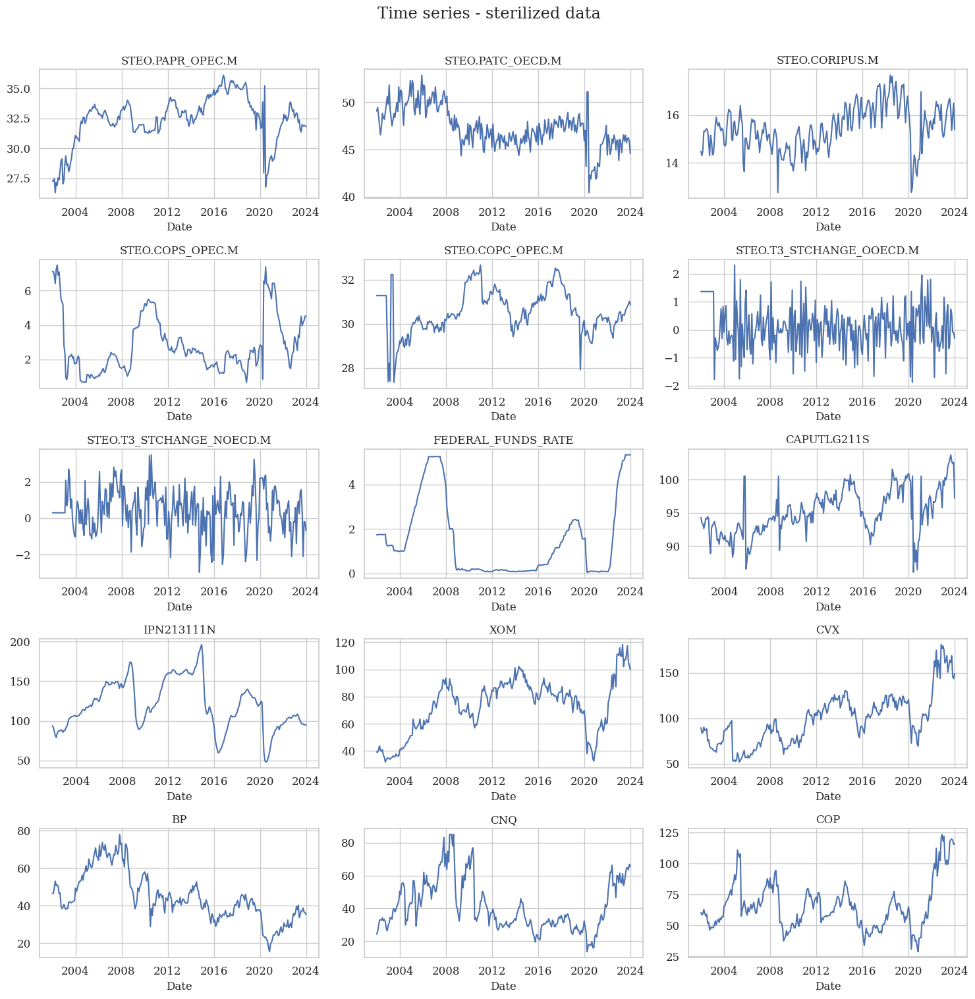

In [46]:
nrows = len(sterilized_df.columns) // 3 + (len(sterilized_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(sterilized_df.columns):
    sns.lineplot(data=sterilized_df[column], ax=axes[idx])
    axes[idx].set_title(column)
    axes[idx].set_xlabel('Date')
    axes[idx].set_ylabel(None)

for i in range(len(sterilized_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Time series - sterilized data', y=1.01)
plt.tight_layout()

plt.show()

## Distributional plot

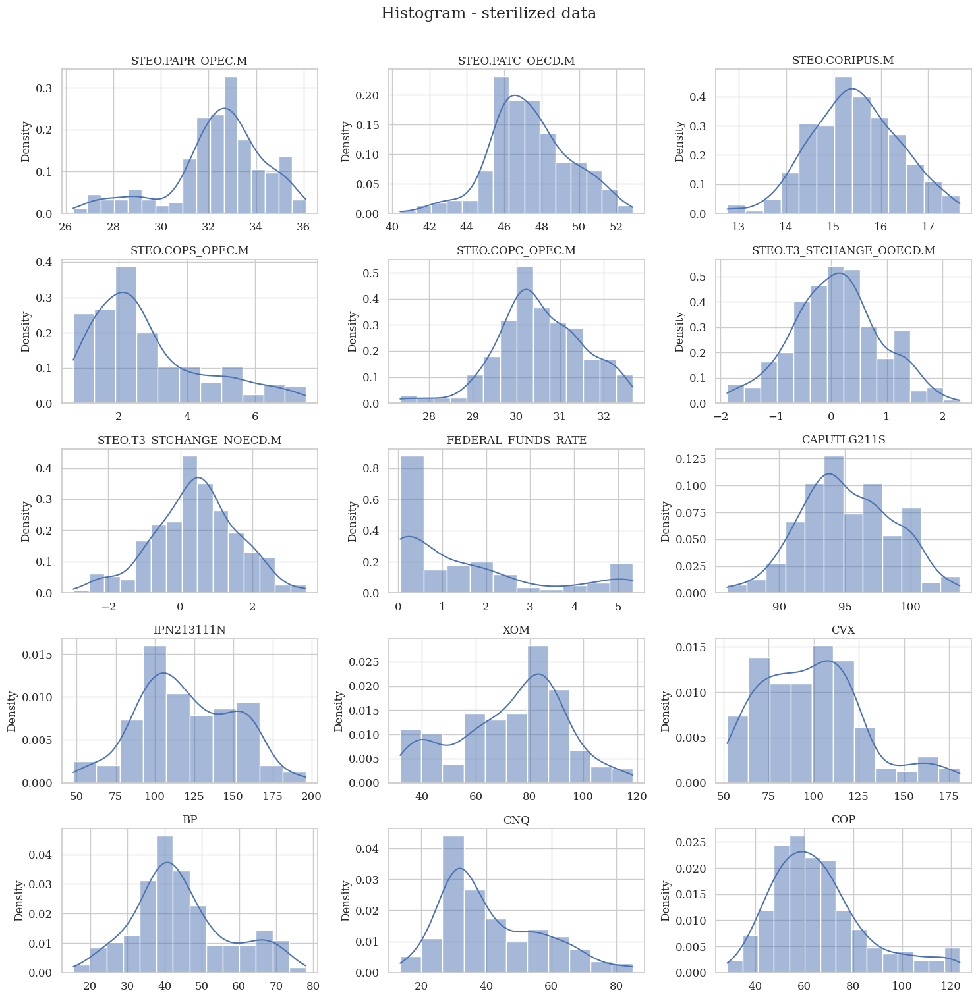

In [47]:
nrows = len(sterilized_df.columns) // 3 + (len(sterilized_df.columns) % 3 > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 3*nrows))

axes = axes.flatten()

for idx, column in enumerate(sterilized_df.columns):
    sns.histplot(data=sterilized_df[column], ax=axes[idx], kde=True, stat='density')
    axes[idx].set_title(column)
    axes[idx].set_xlabel(None)

for i in range(len(sterilized_df.columns), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Histogram - sterilized data', y=1.01)
plt.tight_layout()

plt.show()

## Multivariate plot

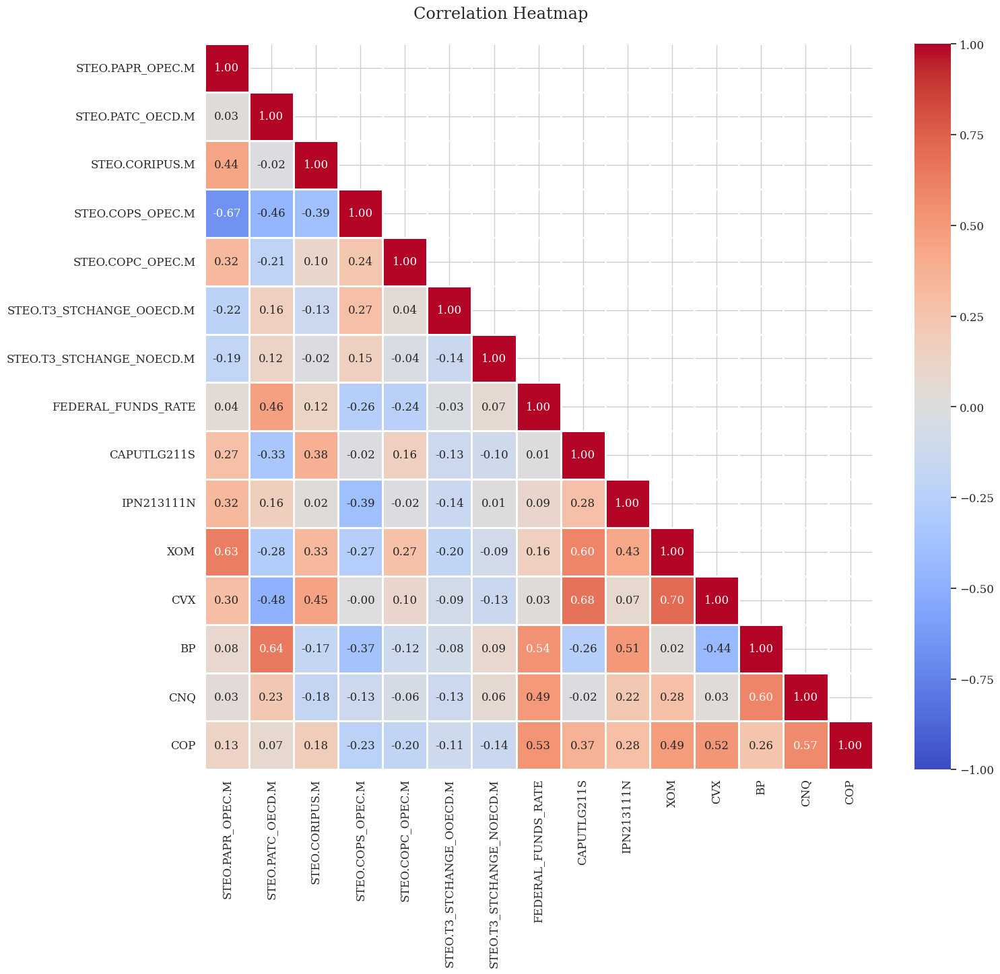

In [48]:
fig, ax = plt.subplots(figsize=(16, 14))
correlation_matrix = sterilized_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=1, vmin=-1, vmax=1, mask=np.triu(correlation_matrix, k=1), ax=ax)
fig.suptitle('Correlation Heatmap', x=0.4, y=0.92)
plt.show()

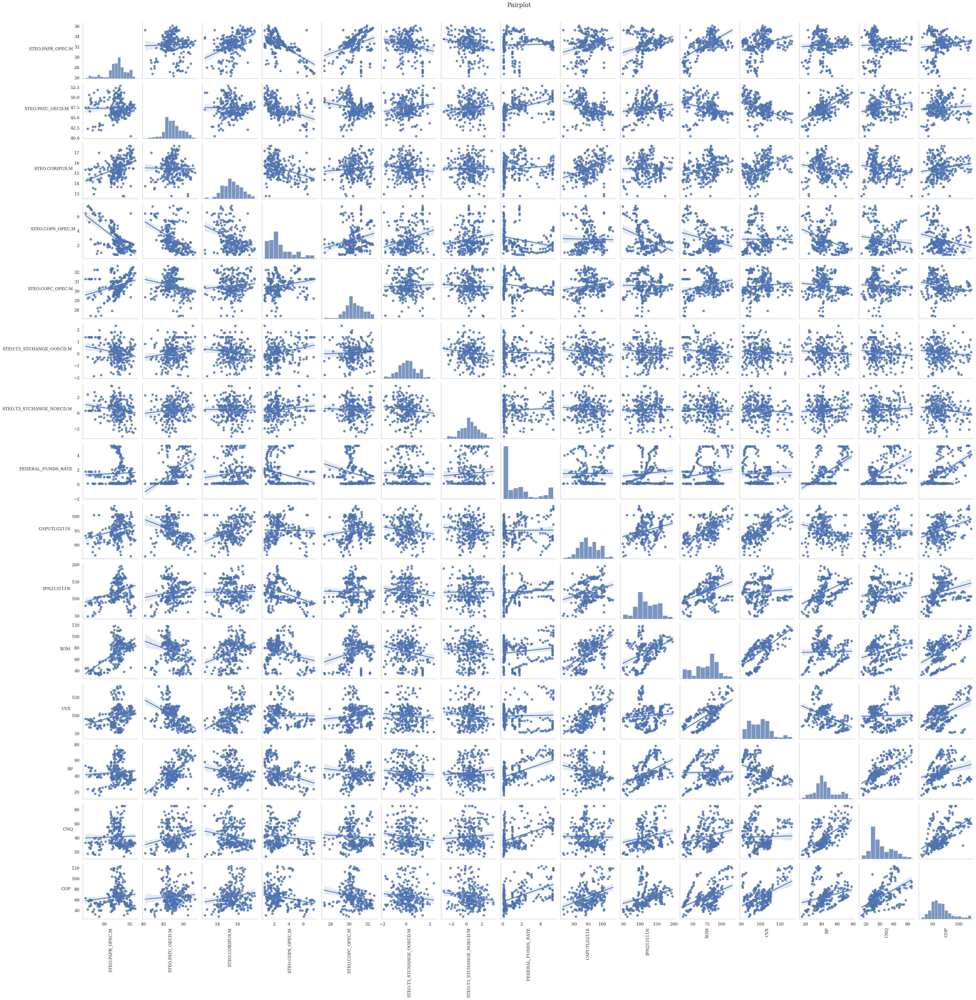

In [49]:
g = sns.pairplot(sterilized_df, kind='reg', height=2.5)
for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), rotation = 90, fontfamily='serif')
    ax.set_ylabel(ax.get_ylabel(), rotation = 0, fontfamily='serif')
    ax.yaxis.get_label().set_horizontalalignment('right')
    ax.grid(False)

g.fig.suptitle("Pairplot", y=1.01, fontfamily='serif')
plt.show()

# Insights on oil price

The West Texas Intermediate (WTI) serves as a benchmark for oil prices. The time-series plot indicates that oil prices have been relatively stable, exhibiting moderate seasonality. Notable spikes, which are significant but not extreme outliers, occurred during the global financial crisis. Additionally, a pronounced spike was observed during the COVID-19 crisis.

The distribution of oil price returns is characterized by a leptokurtic distribution, suggesting low volatility with a slight negative skew.

Analysis of the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots reveals a notable autocorrelation of 25% at lag-1, which is above the significance level. There is also a mild seasonal correlation observable at lag-18.

The Augmented Dickey-Fuller (ADF) test indicates that the series of oil returns is stationary.

Finally, the Jarque-Bera test confirms that the time series does not follow a normal distribution, exhibiting a high kurtosis of 10, indicative of a leptokurtic distribution.

**Suggestion for Future Analysis:**
Given the leptokurtic nature of the distribution and the autocorrelation identified, it would be beneficial to employ models that can handle such characteristics effectively, such as GARCH or ARIMA models, for more accurate forecasting of oil prices. Additionally, considering the impact of external shocks as revealed during the global crises, incorporating macroeconomic variables into the models could further refine predictions and provide deeper insights into price dynamics.

In [50]:
oil_price = macro_economic_df['WTI']
oil_returns = np.log(oil_price) - np.log(oil_price.shift(1))
oil_returns.dropna(inplace=True)

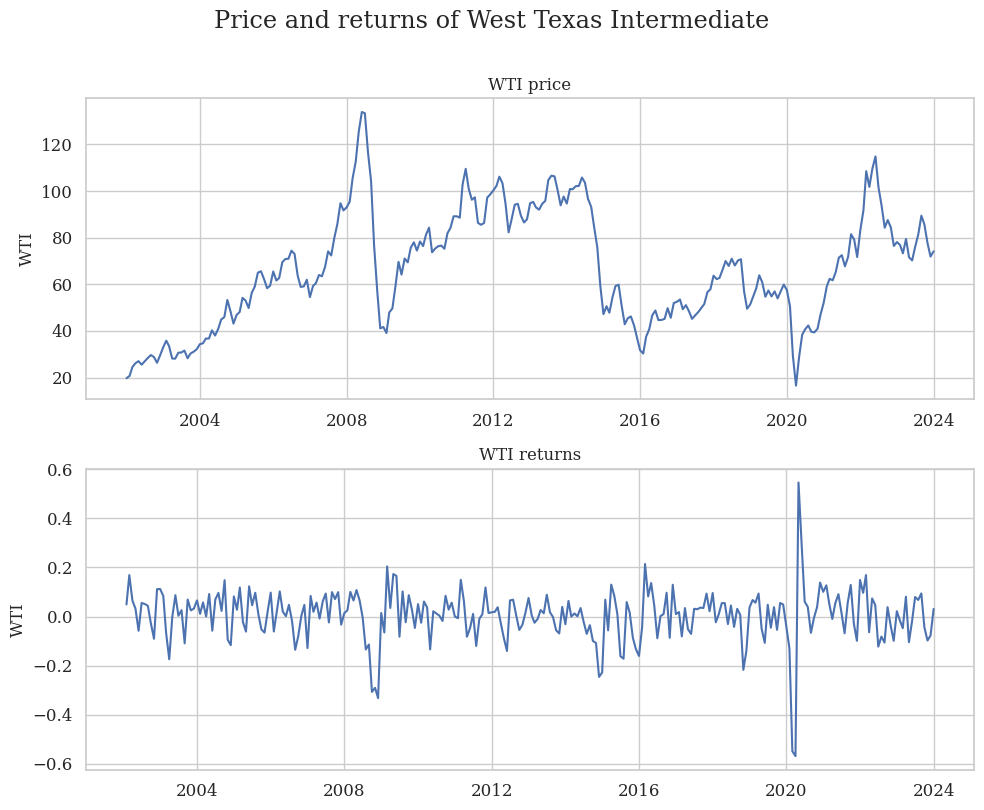

In [51]:
fig, ax = plt.subplots(nrows=2, figsize=(10, 8))

sns.lineplot(oil_price, ax=ax[0]).set_title('WTI price')
sns.lineplot(oil_returns, ax=ax[1]).set_title('WTI returns')

fig.suptitle('Price and returns of West Texas Intermediate', y=1.01)
plt.tight_layout()
plt.show()

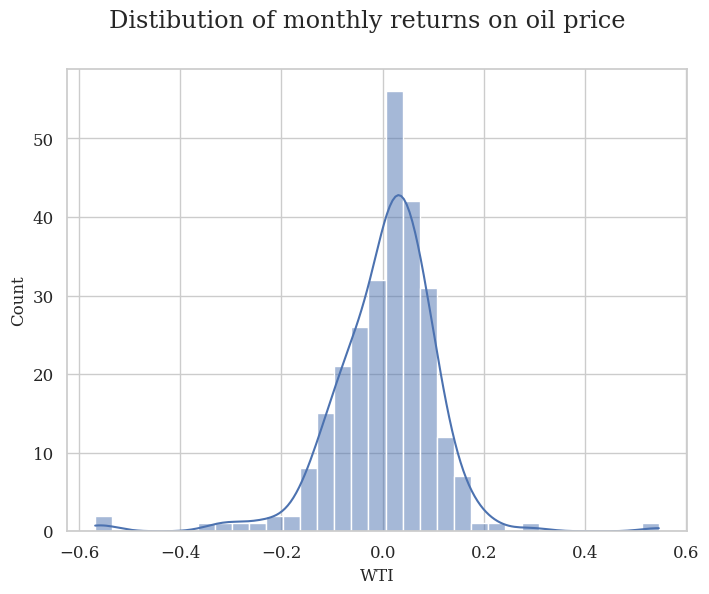

In [52]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.histplot(oil_returns, kde=True)
fig.suptitle('Distibution of monthly returns on oil price')
plt.show()

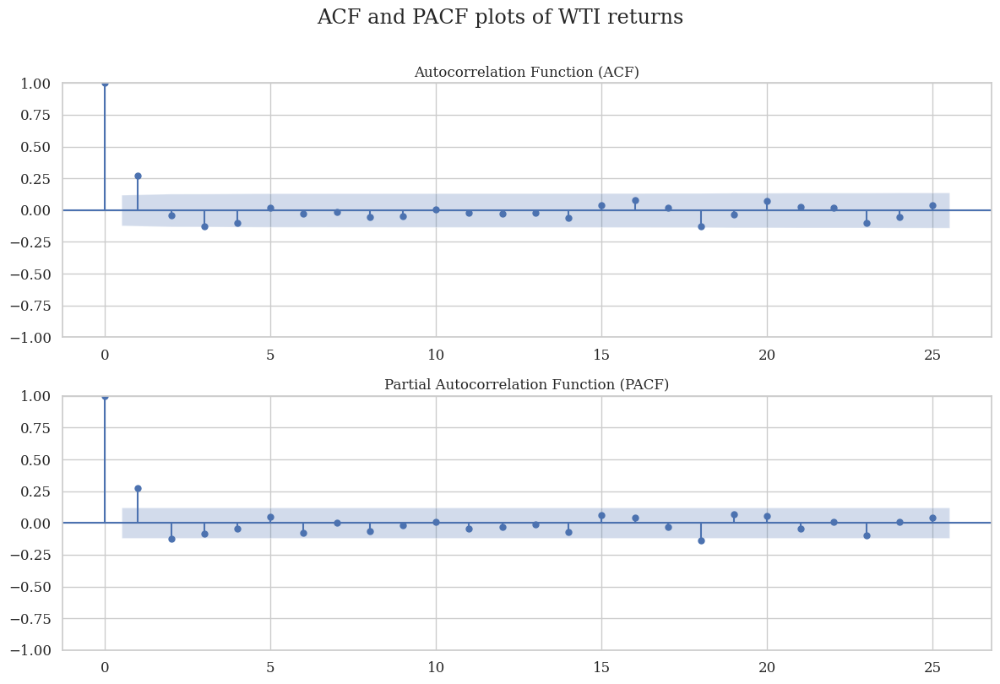

In [53]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(oil_returns, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF)')

plot_pacf(oil_returns, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF)')

fig.suptitle('ACF and PACF plots of WTI returns', y=1.01)
plt.tight_layout()
plt.show()

In [54]:
result = adfuller(oil_returns, autolag='AIC')

print('ADF Statistic:', result[0])
print('p-value:', result[1])

print('Critical Values:')
for key, value in result[4].items():
    print(f'  {key}: {value}')

if result[1] <= 0.05:
    print("\nThe time series is stationary.")
else:
    print("\nThe time series is not stationary.")

ADF Statistic: -11.108127277910798
p-value: 3.718202741176274e-20
Critical Values:
  1%: -3.455558114028747
  5%: -2.872635586277424
  10%: -2.572682677000175

The time series is stationary.


In [55]:
jb_value, p_value, skewness, kurtosis = jarque_bera(oil_returns)

print('Jarque-Bera Test Statistic:', jb_value)
print('p-value:', p_value)
print('Skewness:', skewness)
print('Kurtosis:', kurtosis)

if p_value > 0.05:
    print("\nThe data appears to be normally distributed.")
else:
    print("\nThe data does not appear to be normally distributed.")

Jarque-Bera Test Statistic: 730.6768810288438
p-value: 2.1653657214191705e-159
Skewness: -0.9560390558985769
Kurtosis: 10.922697034281217

The data does not appear to be normally distributed.


# Overview of Probabilistic Graphical Models

Probabilistic Graphical Models (PGM) combines the concepts of Graph theory and Probability theory. It allows to capture the conditional dependence and independence between the variables. Two groups of PGM are

* Belief Network
* Markov Network

## Belief Network

Belief Networks are directed acyclic graph (DAG) with nodes being the variables and the edges being the dependence between the two variables it connects. The belief network uses Bayes' Theorem to calculate the posterior distribution of the cause given the observation, i.e., it uses Bayes Theorem to reverse the conditional probabilities.

$$ \mathbb{P}(H | D) = \frac{\mathbb{P}(D | H) \times \mathbb{P}(H)}{\mathbb{P}(D)} $$

### Learning Belief Networks

Learning belief networks consists of two problems:

* Parameter learning
* Structure learning

Parameter learning involves learning the parameters of the distribution of induvidual variables given the DAG. Parameter learning can be done by using MLE or Bayesian estimation.

Structure learning involves the estimation of DAG given the data. Structure learning can be done using Constraint based learning or Score based learning.

Methods
Structure studying strategies include algorithms like constraint-based techniques (e.g., PC set of rules), rating-based totally methods (e.g., Bayesian Information Criterion), and hybrid methods that integrate factors of each.

Distinguishing Between Parameter Learning and Structure Learning

Nature of Task
Parameter learning makes a speciality of estimating the numerical values related to the existing relationships among variables whereas Structure gaining knowledge of focuses on discovering the relationships themselves, determining which variables are directly linked and how they impact each different.

Fixed vs. Variable Components
In parameter learning, the structure of the model is assumed to be fixed, and the undertaking is to estimate the parameters given this fixed shape while In structure studying, both the parameters and the structure of the model are situation to discovery or change.

Methods
Parameter getting to know regularly entails statistical estimation strategies including most chance estimation or Bayesian estimation while Structure mastering involves algorithms particularly designed to discover or infer the structure of the model, along with constraint-primarily based, rating-based, or hybrid techniques.

In a nutshell, parameter learning is set estimating the numerical values within a given version structure, even as shape learning is about discovering the relationships and connections between variables themselves.


## Markov Network

A Markov property exists when the present state is conditional only on the past one state and is independent of all other states.

$$ \mathbb{P}(X_t | X_{t-1},X_{t-2},...,X_{1}) = \mathbb{P}(X_t | X_{t-1}) $$

A Markov network is used to represent the transitional probability to a future state, given the present state.

For example, considering there are 4 states in a Markov Network, the transitional probability can be denoted as a Matrix as

$$
\begin{bmatrix}
p_{11} = 0.3 & p_{12} = 0.7 & p_{13} = 0 & p_{14} = 0 \\
p_{21} = 0.2 & p_{22} = 0.3 & p_{23} = 0.5 & p_{24} = 0 \\
p_{31} = 0.2 & p_{32} = 0 & p_{33} = 0 & p_{34} = 0.8 \\
p_{41} = 0 & p_{42} = 0 & p_{43} = 0.4 & p_{44} = 0.6 \\
\end{bmatrix}
$$

The matrix can be read as follows:

The first row indicates that, given the present state is 1, the conditional probability that the next state is 1 is 0.3 and the conditional probability that the next state is 2 is 0.7. Given the state is 1, there is no probability that the next state is 3 or 4. Likewise, the subsequent row indicates the conditional probability of state transition for state 2, 3 and 4 respectively.




### Markov Chains

A Markov Chain is a graphical presentation of a stochastic process that transitions between a finite number of states.
 A Markov Chain is primarily used to illustrate phenomenon where the future is conditional only on the present state and is independent of the past states.
Markov Blanket of a node v is the union of the parents of v, its children and its children’s parents. A useful property of the Markov Blanket is that every set of nodes is conditionally independent of v when conditioned on the MB of v

Markov Chains and Markov blankets are associated principles; however, they arrive from extraordinary branches of arithmetic and serve distinct purposes. Markov Chains are a fundamental idea in chance theory and stochastic tactics. Their aim is to symbolize sequences of occasions in which the destiny nation is only dependent on the modern-day state, following the Markov belongings. These chains are typically depicted as a group of states and a transition probability matrix, showcasing the probability of shifting from one nation to some other in a single step. Markov Chains discover big utility across numerous domain names for modelling random phenomena, together with inventory fluctuations, climatic developments, and genetic patterns.








### Markov Blankets

Markov Blankets are an essential concept in Bayesian network theory, focusing on probabilistic graphical models. Their purpose is to determine sets of variables that make a target variable independent of all other variables in the network. When it comes to representation, Markov blankets are typically associated with nodes in a Bayesian network. They include the node itself, its parents, its children, and other parents of its children. Markov blankets play a vital role in probabilistic reasoning, learning, and decision-making within Bayesian networks. By identifying relevant information for predicting the target variable's value, they simplify computations and reduce the number of variables to consider.

# Constraint based algorithm for structure learning

    Algorithm InferredCausality:

    Phase 1:
    1. Learning Markov Blankets
    ```    
    for each X_i in dataSet:
        markov_blankets[X_i] = learnMarkovBlanket(X_i, dataSet)
    ```
    2. Check and drop asymmetric Markov Blankets
    ```
    for each pair (X_i, X_j) where i != j:
        if X_i not in markov_blankets[X_j]:
            markov_blankets[X_i].remove(X_j)
    ```
    Phase 2:
    3. Learning Neighbours
    ```    
    for each pair (X_i, X_j) where i != j:
        neighbours[(X_i, X_j)] = findNeighbours(X_i, X_j, markov_blankets)
    ```
    4. Correct asymmetric neighbours
    ```
    for each pair (X_i, X_j) where i != j:
        if X_i not in neighbours[X_j]:
            neighbours[X_i].add(X_j)
            neighbours[X_j].add(X_i)
    ```
    Phase 3:
    5. Learning Arc Directions
    ```    
    for each pair (X_i, X_j) where i != j:
        for commonNeighbour X_k between X_i and X_j:
            if X_k not in neighbours[X_i] or X_k not in neighbours[X_j]:
                arcs[(X_i, X_j)] = (X_i, X_k, X_j)
    ```
    6. Set direction of undirected arcs
    ```
    for (X_i, X_j, '-') in arcs:
        if existsStrictlyDirectedPath(X_i, X_j):
            setDirection(X_i, X_j, '->')
        if notAdjacent(X_i, X_j) and (X_i, X_j, '->') and (X_k, X_j, '-'):
            setDirection(X_k, X_j, '->')
    ```

# References

Alvi, Danish A. “Application of Probabilistic Graphical Models in Forecasting Crude Oil Price.” ArXiv.org, 2018, www.arxiv.org/abs/1804.10869.

‌“Energy & Financial Markets: What Drives Crude Oil Prices? - Energy Information Administration.” Eia.gov, 2024, www.eia.gov/finance/markets/crudeoil/.